 # NATURAL LANGUAGE PROCESSING

In [1]:
import nltk
import pandas as pd
import numpy as np

In [2]:
# A nltk dataset
nltk.download('movie_reviews')

[nltk_data] Downloading package movie_reviews to C:\Users\Tole
[nltk_data]     01\AppData\Roaming\nltk_data...
[nltk_data]   Package movie_reviews is already up-to-date!


True

In [3]:
import requests
from bs4 import BeautifulSoup

# PARSED Data from different language's databases 
url = 'https://raw.githubusercontent.com/nltk/nltk_data/gh-pages/index.xml'
request = requests.get(url)
parser = BeautifulSoup(request.text,'lxml')

# Find all the ID for different datasets
download_list = parser.find_all('item')

# Convert them into str
download_nlp_list = [str(x) for x in download_list]

# Create a DF with the dataset's IDs
DF_ID = pd.DataFrame(download_nlp_list, columns=['Ref'])
DF_ID["Dataset's ID for Download"] = DF_ID.Ref.str.extract(r'((?<=\")\w*(?=\"))')
del DF_ID['Ref']
DF_ID

C:\Users\Tole 01\anaconda3\lib\site-packages\bs4\builder\__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML parser will be more reliable. To parse this document as XML, make sure you have the lxml package installed, and pass the keyword argument `features="xml"` into the BeautifulSoup constructor.
  warnings.warn(


,Dataset's ID for Download
0,abc
1,alpino
2,averaged_perceptron_tagger
3,averaged_perceptron_tagger_ru
4,basque_grammars
...,...
393,words
394,maxent_ne_chunker
395,punkt
396,snowball_data


## nlp Data's Location 

In [4]:
%cd C:\Users\Tole 01\AppData\Roaming\nltk_data\corpora\movie_reviews

C:\Users\Tole 01\AppData\Roaming\nltk_data\corpora\movie_reviews


In [5]:
ls

 Volume in drive C is Windows-SSD
 Volume Serial Number is 585C-3D72

 Directory of C:\Users\Tole 01\AppData\Roaming\nltk_data\corpora\movie_reviews

02/23/2023  05:50 PM    <DIR>          .
02/24/2023  07:46 PM    <DIR>          ..
02/23/2023  05:50 PM    <DIR>          neg
02/23/2023  05:50 PM    <DIR>          pos
02/23/2023  05:50 PM             4,567 README
               1 File(s)          4,567 bytes
               4 Dir(s)  112,726,401,024 bytes free


## Open nlp Libraries

In [6]:
from nltk.corpus import movie_reviews_reviews

In [8]:
# Files that comprenhend the folder called movie reviews
movie_reviews.fileids()

['neg/cv000_29416.txt',
 'neg/cv001_19502.txt',
 'neg/cv002_17424.txt',
 'neg/cv003_12683.txt',
 'neg/cv004_12641.txt',
 'neg/cv005_29357.txt',
 'neg/cv006_17022.txt',
 'neg/cv007_4992.txt',
 'neg/cv008_29326.txt',
 'neg/cv009_29417.txt',
 'neg/cv010_29063.txt',
 'neg/cv011_13044.txt',
 'neg/cv012_29411.txt',
 'neg/cv013_10494.txt',
 'neg/cv014_15600.txt',
 'neg/cv015_29356.txt',
 'neg/cv016_4348.txt',
 'neg/cv017_23487.txt',
 'neg/cv018_21672.txt',
 'neg/cv019_16117.txt',
 'neg/cv020_9234.txt',
 'neg/cv021_17313.txt',
 'neg/cv022_14227.txt',
 'neg/cv023_13847.txt',
 'neg/cv024_7033.txt',
 'neg/cv025_29825.txt',
 'neg/cv026_29229.txt',
 'neg/cv027_26270.txt',
 'neg/cv028_26964.txt',
 'neg/cv029_19943.txt',
 'neg/cv030_22893.txt',
 'neg/cv031_19540.txt',
 'neg/cv032_23718.txt',
 'neg/cv033_25680.txt',
 'neg/cv034_29446.txt',
 'neg/cv035_3343.txt',
 'neg/cv036_18385.txt',
 'neg/cv037_19798.txt',
 'neg/cv038_9781.txt',
 'neg/cv039_5963.txt',
 'neg/cv040_8829.txt',
 'neg/cv041_22364.txt',


In [9]:
# Negative Reviews
movie_reviews.fileids()[:5]

['neg/cv000_29416.txt',
 'neg/cv001_19502.txt',
 'neg/cv002_17424.txt',
 'neg/cv003_12683.txt',
 'neg/cv004_12641.txt']

In [11]:
# Positive reviews
movie_reviews.fileids()[-5:]

['pos/cv995_21821.txt',
 'pos/cv996_11592.txt',
 'pos/cv997_5046.txt',
 'pos/cv998_14111.txt',
 'pos/cv999_13106.txt']

In [14]:
# Number of files
len(movie_reviews.fileids())

2000

In [17]:
positive_fileids = movie_reviews.fileids('pos')
negative_fileids = movie_reviews.fileids('neg')

In [18]:
len(positive_fileids), len(negative_fileids)

(1000, 1000)

In [23]:
# Open one of the txt files from positive_fileids and convert them into sentences
movie_reviews.raw(fileids=positive_fileids[0])

'films adapted from comic books have had plenty of success , whether they\'re about superheroes ( batman , superman , spawn ) , or geared toward kids ( casper ) or the arthouse crowd ( ghost world ) , but there\'s never really been a comic book like from hell before . \nfor starters , it was created by alan moore ( and eddie campbell ) , who brought the medium to a whole new level in the mid \'80s with a 12-part series called the watchmen . \nto say moore and campbell thoroughly researched the subject of jack the ripper would be like saying michael jackson is starting to look a little odd . \nthe book ( or " graphic novel , " if you will ) is over 500 pages long and includes nearly 30 more that consist of nothing but footnotes . \nin other words , don\'t dismiss this film because of its source . \nif you can get past the whole comic book thing , you might find another stumbling block in from hell\'s directors , albert and allen hughes . \ngetting the hughes brothers to direct this seem

# Tokenization in 5 Steps

Tokenizing is the same as analazing a text to split it into words.

It's a heavy duty because it may have some mistakes on punctuation as well as shortened words or hyphenated words (New-York).

## 1st step: Select the Text

In [24]:
romeo_text = """Why then, O brawling love! O loving hate!
O any thing, of nothing first create!
O heavy lightness, serious vanity,
Misshapen chaos of well-seeming forms,
Feather of lead, bright smoke, cold fire, sick health,
Still-waking sleep, that is not what it is!
This love feel I, that feel no love in this."""

In [32]:
# We split the text to compare it on the next cells.
romeo_text.split()

['Why',
 'then,',
 'O',
 'brawling',
 'love!',
 'O',
 'loving',
 'hate!',
 'O',
 'any',
 'thing,',
 'of',
 'nothing',
 'first',
 'create!',
 'O',
 'heavy',
 'lightness,',
 'serious',
 'vanity,',
 'Misshapen',
 'chaos',
 'of',
 'well-seeming',
 'forms,',
 'Feather',
 'of',
 'lead,',
 'bright',
 'smoke,',
 'cold',
 'fire,',
 'sick',
 'health,',
 'Still-waking',
 'sleep,',
 'that',
 'is',
 'not',
 'what',
 'it',
 'is!',
 'This',
 'love',
 'feel',
 'I,',
 'that',
 'feel',
 'no',
 'love',
 'in',
 'this.']

## 2nd Step: Download and Call Punkt to Tokenize

Punkt is a library that is trained to tokenize words on English. So we call it through the function **`nltk.word_tokenize()`**. Its argument is the text we want to split. 

Stopwords like the, is, which don't have any meaning, so they're neutral.

In [30]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to C:\Users\Tole
[nltk_data]     01\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [31]:
# It splits better the text
romeo_words = nltk.word_tokenize(romeo_text)
romeo_words

['Why',
 'then',
 ',',
 'O',
 'brawling',
 'love',
 '!',
 'O',
 'loving',
 'hate',
 '!',
 'O',
 'any',
 'thing',
 ',',
 'of',
 'nothing',
 'first',
 'create',
 '!',
 'O',
 'heavy',
 'lightness',
 ',',
 'serious',
 'vanity',
 ',',
 'Misshapen',
 'chaos',
 'of',
 'well-seeming',
 'forms',
 ',',
 'Feather',
 'of',
 'lead',
 ',',
 'bright',
 'smoke',
 ',',
 'cold',
 'fire',
 ',',
 'sick',
 'health',
 ',',
 'Still-waking',
 'sleep',
 ',',
 'that',
 'is',
 'not',
 'what',
 'it',
 'is',
 '!',
 'This',
 'love',
 'feel',
 'I',
 ',',
 'that',
 'feel',
 'no',
 'love',
 'in',
 'this',
 '.']

In [33]:
movie_reviews.words(fileids=positive_fileids[0])

['films', 'adapted', 'from', 'comic', 'books', 'have', ...]

## 3rd Step: Create a Bag of Words

This term is used to refer to a words dataset or bank which will be used as reference. This reference will be compared with a given text in order to obtain boolean data for sentiment analysis.

In [43]:
# The function stablish True values for all the keys
def build_bag_of_words_features(words):
    return {word:True for word in words}

In [46]:
build_bag_of_words_features(romeo_words)

{'Why': True,
 'then': True,
 ',': True,
 'O': True,
 'brawling': True,
 'love': True,
 '!': True,
 'loving': True,
 'hate': True,
 'any': True,
 'thing': True,
 'of': True,
 'nothing': True,
 'first': True,
 'create': True,
 'heavy': True,
 'lightness': True,
 'serious': True,
 'vanity': True,
 'Misshapen': True,
 'chaos': True,
 'well-seeming': True,
 'forms': True,
 'Feather': True,
 'lead': True,
 'bright': True,
 'smoke': True,
 'cold': True,
 'fire': True,
 'sick': True,
 'health': True,
 'Still-waking': True,
 'sleep': True,
 'that': True,
 'is': True,
 'not': True,
 'what': True,
 'it': True,
 'This': True,
 'feel': True,
 'I': True,
 'no': True,
 'in': True,
 'this': True,
 '.': True}

In [47]:
# This calls the type of the previous data structure
type(_)

dict

## 4th Step: Create a List with Stopwords

**stopwords** is a dataset that has stopwords that are useless for sentiment analysis, including punctuation marks. So we will use it to create a list that contains them.

In [48]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to C:\Users\Tole
[nltk_data]     01\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


True

In [49]:
# This library imports useless punctuaction marks. It comes from stop
import string

string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

### Stopwords and Punctuation Marks List

If you access to the function **`nltk.corpus.stopwords.words()`**, you would observe a list of different stopwords. Its argument requires the used language on str.

In [52]:
nltk.corpus.stopwords.words("english")

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [53]:
# Create a list of useless stopwords and punctuation marks
useless_words = nltk.corpus.stopwords.words("english") + list(string.punctuation)
useless_words

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

## 5th Step: Drop the Stepwords and Filter the Useful Data

In [59]:
def build_bag_of_words_features_filtered(words):
    return {word:1 for word in words if not word in useless_words}

In [60]:
build_bag_of_words_features_filtered(romeo_words)

{'Why': 1,
 'O': 1,
 'brawling': 1,
 'love': 1,
 'loving': 1,
 'hate': 1,
 'thing': 1,
 'nothing': 1,
 'first': 1,
 'create': 1,
 'heavy': 1,
 'lightness': 1,
 'serious': 1,
 'vanity': 1,
 'Misshapen': 1,
 'chaos': 1,
 'well-seeming': 1,
 'forms': 1,
 'Feather': 1,
 'lead': 1,
 'bright': 1,
 'smoke': 1,
 'cold': 1,
 'fire': 1,
 'sick': 1,
 'health': 1,
 'Still-waking': 1,
 'sleep': 1,
 'This': 1,
 'feel': 1,
 'I': 1}

# Ploting Frequencies of Words

We're gonna extract all the words with the function **`.words()`**. There are near to 1.6 million of words.

In [62]:
all_words = movie_reviews.words()
len(all_words)

1583820

In [63]:
# Transforming it into a Million basis
len(all_words)/1e6

1.58382

In [65]:
# Drop stopwords and filter the useful words
filtered_words = [word for word in movie_reviews.words() if not word in useless_words]
len(filtered_words)

710579

In [66]:
len(filtered_words)/1e6

0.710579

## Words Counter

We're gonna count the number of ocurrences of a word with **`Counter()`**.  Using the instance **`most_common()`** we'll sort values in descending order,  observing the most common words at the beginning.

In [67]:
from collections import Counter
word_counter = Counter(filtered_words)
word_counter

Counter({'plot': 1513,
         'two': 1911,
         'teen': 151,
         'couples': 27,
         'go': 1113,
         'church': 69,
         'party': 183,
         'drink': 32,
         'drive': 105,
         'get': 1949,
         'accident': 104,
         'one': 5852,
         'guys': 268,
         'dies': 104,
         'girlfriend': 218,
         'continues': 88,
         'see': 1749,
         'life': 1586,
         'nightmares': 26,
         'deal': 219,
         'watch': 603,
         'movie': 5771,
         'sorta': 10,
         'find': 782,
         'critique': 61,
         'mind': 451,
         'fuck': 17,
         'generation': 96,
         'touches': 55,
         'cool': 208,
         'idea': 386,
         'presents': 78,
         'bad': 1395,
         'package': 30,
         'makes': 992,
         'review': 295,
         'even': 2565,
         'harder': 33,
         'write': 119,
         'since': 768,
         'generally': 103,
         'applaud': 10,
         'films': 15

In [68]:
word_counter.most_common()

[('film', 9517),
 ('one', 5852),
 ('movie', 5771),
 ('like', 3690),
 ('even', 2565),
 ('good', 2411),
 ('time', 2411),
 ('story', 2169),
 ('would', 2109),
 ('much', 2049),
 ('character', 2020),
 ('also', 1967),
 ('get', 1949),
 ('two', 1911),
 ('well', 1906),
 ('characters', 1859),
 ('first', 1836),
 ('--', 1815),
 ('see', 1749),
 ('way', 1693),
 ('make', 1642),
 ('life', 1586),
 ('really', 1558),
 ('films', 1536),
 ('plot', 1513),
 ('little', 1501),
 ('people', 1455),
 ('could', 1427),
 ('scene', 1397),
 ('man', 1396),
 ('bad', 1395),
 ('never', 1374),
 ('best', 1333),
 ('new', 1292),
 ('scenes', 1274),
 ('many', 1268),
 ('director', 1237),
 ('know', 1217),
 ('movies', 1206),
 ('action', 1172),
 ('great', 1148),
 ('another', 1121),
 ('love', 1119),
 ('go', 1113),
 ('made', 1084),
 ('us', 1073),
 ('big', 1064),
 ('end', 1062),
 ('something', 1061),
 ('back', 1060),
 ('still', 1047),
 ('world', 1037),
 ('seems', 1033),
 ('work', 1020),
 ('makes', 992),
 ('however', 989),
 ('every', 947)

In [69]:
most_common_words = word_counter.most_common()[:10]
most_common_words

[('film', 9517),
 ('one', 5852),
 ('movie', 5771),
 ('like', 3690),
 ('even', 2565),
 ('good', 2411),
 ('time', 2411),
 ('story', 2169),
 ('would', 2109),
 ('much', 2049)]

## Plotting Words Counter

### Log

We'll plot logrythmically the word's frequency vs Word Rank

We can sort the word counts and plot their values on Logarithmic axes to check the shape of the distribution. 

This visualization is particularly useful if comparing 2 or more datasets, a flatter distribution indicates (as we'll observe on the next curve) a large vocabulary while a peaked distribution a restricted vocabulary often due to a focused topic or specialized language.

In [70]:
%matplotlib inline
import matplotlib.pyplot as plt

Text(0.5, 0, 'Word Rank')

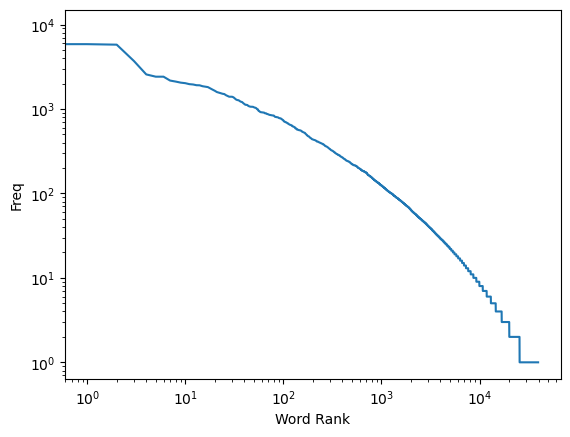

In [76]:
sorted_word_counts = sorted(list(word_counter.values()), reverse=True)

plt.loglog(sorted_word_counts)
plt.ylabel('Freq')
plt.xlabel('Word Rank')

### Histogram

Another related plot is the histogram of `sorted_word_counts`, which displays how many words have a count in a specific range.

Of course the distribution is highly peaked at low counts, i.e. most of the words appear which a low count, so we better display it on semilogarithmic axes to inspect the tail of the distribution.

The log argument change x and y limits to a log scale. It's used to observe the data in a better way.

(array([3.897e+04, 3.610e+02, 1.170e+02, 4.300e+01, 4.000e+01, 1.500e+01,
        9.000e+00, 8.000e+00, 5.000e+00, 4.000e+00, 6.000e+00, 2.000e+00,
        2.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        2.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 1.000e+00]),
 array([1.00000e+00, 1.91320e+02, 3.81640e+02, 5.71960e+02, 7.62280e+02,
        9.52600e+02, 1.14292e+03, 1.33324e+03, 1.52356e+03, 1.71388e+03,
        1.90420e+03, 2.09452e+03, 2.28484e+03, 2.47516e+03, 2.66548e+03,
        2.85580e+03, 3.04612e+03, 3.23644e+03, 3.42676e+03, 3.61708e+03,
        3.80740e+03, 3.99772e+03, 4.18804e+03, 4.37836e+03, 4.56868e+03,
        4.7

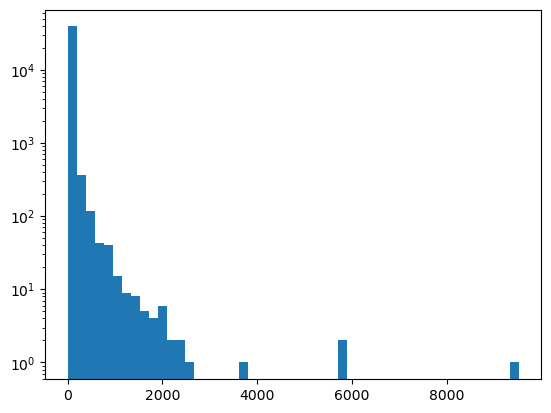

In [83]:
# bins means that our data has been divided in a certain number of bars
plt.hist(sorted_word_counts, bins=50, log=True)

## ML categorization for the Sentiment Analysis

One of the simplest supervised machine learning classifiers is the Naive Bayes Classifier, it can be trained on 80% of the data to learn what words are generally associated with positive or with negative reviews.

In [87]:
# The function will eliminate stopwords on each txt file
# 'neg' will be the label. 
negative_features = [
    (build_bag_of_words_features_filtered(movie_reviews.words(fileids=[f]))
     , 'neg')
for f in negative_fileids]

negative_features

[({'plot': 1,
   'two': 1,
   'teen': 1,
   'couples': 1,
   'go': 1,
   'church': 1,
   'party': 1,
   'drink': 1,
   'drive': 1,
   'get': 1,
   'accident': 1,
   'one': 1,
   'guys': 1,
   'dies': 1,
   'girlfriend': 1,
   'continues': 1,
   'see': 1,
   'life': 1,
   'nightmares': 1,
   'deal': 1,
   'watch': 1,
   'movie': 1,
   'sorta': 1,
   'find': 1,
   'critique': 1,
   'mind': 1,
   'fuck': 1,
   'generation': 1,
   'touches': 1,
   'cool': 1,
   'idea': 1,
   'presents': 1,
   'bad': 1,
   'package': 1,
   'makes': 1,
   'review': 1,
   'even': 1,
   'harder': 1,
   'write': 1,
   'since': 1,
   'generally': 1,
   'applaud': 1,
   'films': 1,
   'attempt': 1,
   'break': 1,
   'mold': 1,
   'mess': 1,
   'head': 1,
   'lost': 1,
   'highway': 1,
   'memento': 1,
   'good': 1,
   'ways': 1,
   'making': 1,
   'types': 1,
   'folks': 1,
   'snag': 1,
   'correctly': 1,
   'seem': 1,
   'taken': 1,
   'pretty': 1,
   'neat': 1,
   'concept': 1,
   'executed': 1,
   'terribly':

In [88]:
positive_features = [
    (build_bag_of_words_features_filtered(movie_reviews.words(fileids=[f]))
     , 'pos')
for f in positive_fileids]

positive_features

[({'films': 1,
   'adapted': 1,
   'comic': 1,
   'books': 1,
   'plenty': 1,
   'success': 1,
   'whether': 1,
   'superheroes': 1,
   'batman': 1,
   'superman': 1,
   'spawn': 1,
   'geared': 1,
   'toward': 1,
   'kids': 1,
   'casper': 1,
   'arthouse': 1,
   'crowd': 1,
   'ghost': 1,
   'world': 1,
   'never': 1,
   'really': 1,
   'book': 1,
   'like': 1,
   'hell': 1,
   'starters': 1,
   'created': 1,
   'alan': 1,
   'moore': 1,
   'eddie': 1,
   'campbell': 1,
   'brought': 1,
   'medium': 1,
   'whole': 1,
   'new': 1,
   'level': 1,
   'mid': 1,
   '80s': 1,
   '12': 1,
   'part': 1,
   'series': 1,
   'called': 1,
   'watchmen': 1,
   'say': 1,
   'thoroughly': 1,
   'researched': 1,
   'subject': 1,
   'jack': 1,
   'ripper': 1,
   'would': 1,
   'saying': 1,
   'michael': 1,
   'jackson': 1,
   'starting': 1,
   'look': 1,
   'little': 1,
   'odd': 1,
   'graphic': 1,
   'novel': 1,
   '500': 1,
   'pages': 1,
   'long': 1,
   'includes': 1,
   'nearly': 1,
   '30': 1,

### NaiveBayesClassifier

We must import the model called **`NaiveBayesClassifier`**. The corresponding training function is the next:

-**`NaiveBayesClassifier.train( training dataset )`**

In [89]:
# Import the NaiveBayes Classifier
from nltk.classify import NaiveBayesClassifier

In [94]:
# We must save the variable as an int. It has to accomplish 80% of the data to train it.
split = 800

In [90]:
sentiment_calssifier = NaiveBayesClassifier.train(
    positive_features[:split] + negative_features[:split])

We'll evaluate the classifier's efficiency with the training and testing data using the next function:

- **`nltk.classify.util.accuracy(model, dataset)`**

In [91]:
# Training data
nltk.classify.util.accuracy(sentiment_calssifier,positive_features[:split] + negative_features[:split])

0.980625

In [92]:
# Testing data
nltk.classify.util.accuracy(sentiment_calssifier,positive_features[split:] + negative_features[split:])

0.7175

### More ML Features

The function **`sentiment_calssifier.show_most_informative_features()`** shows how the words are ponderated in the positive and negatives categories.

In [93]:
sentiment_calssifier.show_most_informative_features()

Most Informative Features
             outstanding = 1                 pos : neg    =     13.9 : 1.0
               insulting = 1                 neg : pos    =     13.7 : 1.0
              vulnerable = 1                 pos : neg    =     13.0 : 1.0
               ludicrous = 1                 neg : pos    =     12.6 : 1.0
             uninvolving = 1                 neg : pos    =     12.3 : 1.0
              astounding = 1                 pos : neg    =     11.7 : 1.0
                  avoids = 1                 pos : neg    =     11.7 : 1.0
             fascination = 1                 pos : neg    =     11.0 : 1.0
               affecting = 1                 pos : neg    =     10.3 : 1.0
               animators = 1                 pos : neg    =     10.3 : 1.0
